# (27) contrast latency explore

project = ```iP-VAE```, host = ```chewie```, device = ```cuda:0```

**Motivation**: <br>

explore fig: contrast/latency

Using: (16, 24.0)

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.convergence import plot_convergence
from figures.imgs import plot_weights
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from analysis.tuning import drifting_grating_feeder, drifting_grating_feeder_params
from utils.animation import show_movie


device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: mach

## Basic setup

In [3]:
pal_models = get_palette_models()

chkpts_dir = add_home('Dropbox/chkpts/_IterativeVAE')
figs_dir = pjoin(fig_base_dir, 'figs_2025-03')
os.makedirs(figs_dir, exist_ok=True)

len(os.listdir(chkpts_dir)), len(os.listdir(figs_dir))

(420, 2)

In [4]:
files = [f for f in os.listdir(chkpts_dir) if 'vH16' in f]
files = sorted(files, key=alphanum_sort_key)

In [5]:
seq_len, beta = 16, 24

selected_fits = [
    f for f in files if (
        f't-{seq_len}_b-{beta:0.3g}' in f
        and 'softplus' not in f)
]
print(selected_fits)

[
    'gaussian+relu-<grad|lin>-vH16-t-16_b-24_mach-1_(2025_03_07,04:45)',
    'gaussian-<grad|lin>-vH16-t-16_b-24_mach-1_(2025_03_07,04:09)',
    'poisson-<grad|lin>-vH16-t-16_b-24_mach-1_(2025_03_07,07:38)'
]

## Load trainer

In [6]:
f = next(f for f in selected_fits if 'poisson' in f)
tr = load_model_lite(pjoin(chkpts_dir, f), device=device)[0]

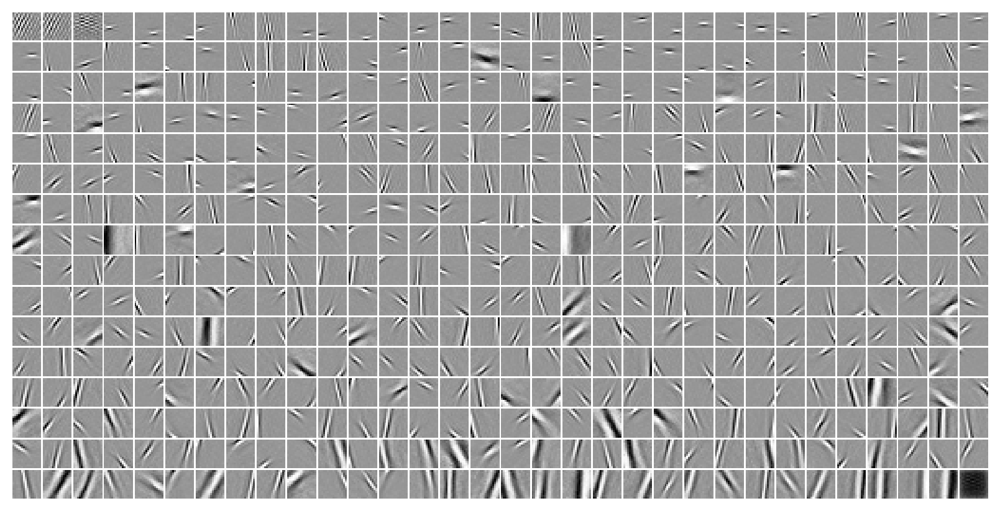

In [7]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
order = np.argsort(u0)
tr.model.show(order=order, method='abs-max');

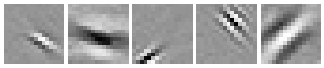

In [8]:
selected_neurons = [380, 47, 281, 117, 338]
tr.model.show(order=order[selected_neurons], method='abs-max', nrows=1, dpi=40);

100%|██████████████████████████████████| 5/5 [09:02<00:00, 108.54s/it]


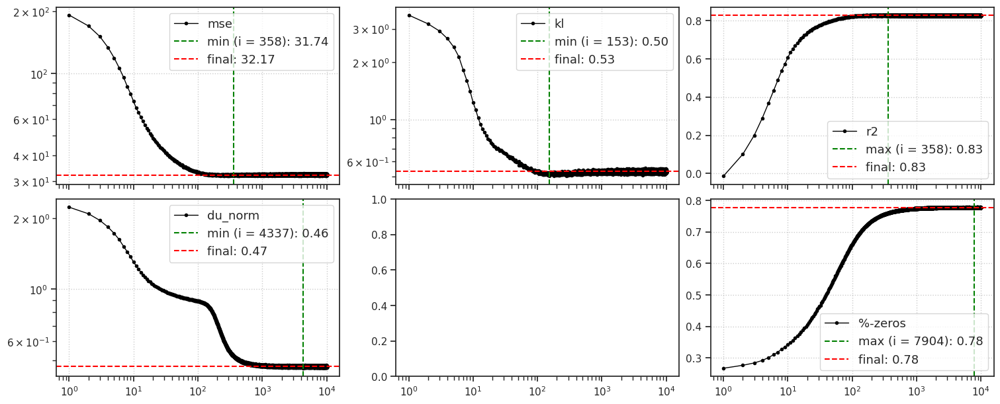

CPU times: user 9h 47min 36s, sys: 19min 32s, total: 10h 7min 8s
Wall time: 10min 33s


In [16]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=5,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### drifting-grating feeder

In [9]:
param_grid = drifting_grating_feeder_params(
    contrast_min=1.0,
    contrast_max=1.0,
    s_freq_min=0.2,
    s_freq_max=8.0,
    s_freq_delta=0.2,
)

n_frames_for_full_cycle = 500

feeder, feeder_kws = drifting_grating_feeder(
    npix=tr.model.cfg.input_sz[-1],
    param_grid=param_grid,
    device=device,
    n_frames_per_cycle=n_frames_for_full_cycle,
)

In [10]:
len(param_grid)

1480

### fwd: xtract ftrs

In [11]:
%%time


trial_timepoints = range(
    n_frames_for_full_cycle,
    n_frames_for_full_cycle * 2,
)
n_trials = 100

spk_counts_all = []
for i in tqdm(range(n_trials)):
    tr.model.cfg.set_seeds(i)

    output = tr.model.xtract_ftr(
        feeder=FEEDER_CLASSES['drifting-grating'](**feeder_kws),
        seq=range(2 * n_frames_for_full_cycle),
        return_extras=['samples'],
    ).stack()

    spks = output['samples'][:, trial_timepoints]
    spk_counts_all.append(tonp(spks.sum(1)))

spk_counts_all = np.stack(spk_counts_all)
spk_counts_all.shape

100%|█████████████████████████████████████████| 100/100 [06:32<00:00,  3.92s/it]

CPU times: user 5min 51s, sys: 2.21 s, total: 5min 53s
Wall time: 6min 32s


(100, 1480, 512)

In [12]:
shape = (n_trials, *param_grid.param_lengths, tr.model.cfg.n_latents[0])

avg_spk_counts = spk_counts_all.reshape(shape)
avg_spk_counts = avg_spk_counts.mean(0)
avg_spk_counts.shape

(1, 40, 37, 512)

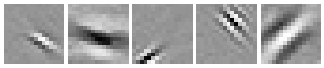

In [13]:
tr.model.show(order=order[selected_neurons], method='abs-max', nrows=1, dpi=40);

In [14]:
neuron_i = order[selected_neurons[-1]]
tuning = avg_spk_counts[..., neuron_i]

x2p = tuning[0, ...]
x2p /= np.sum(x2p)

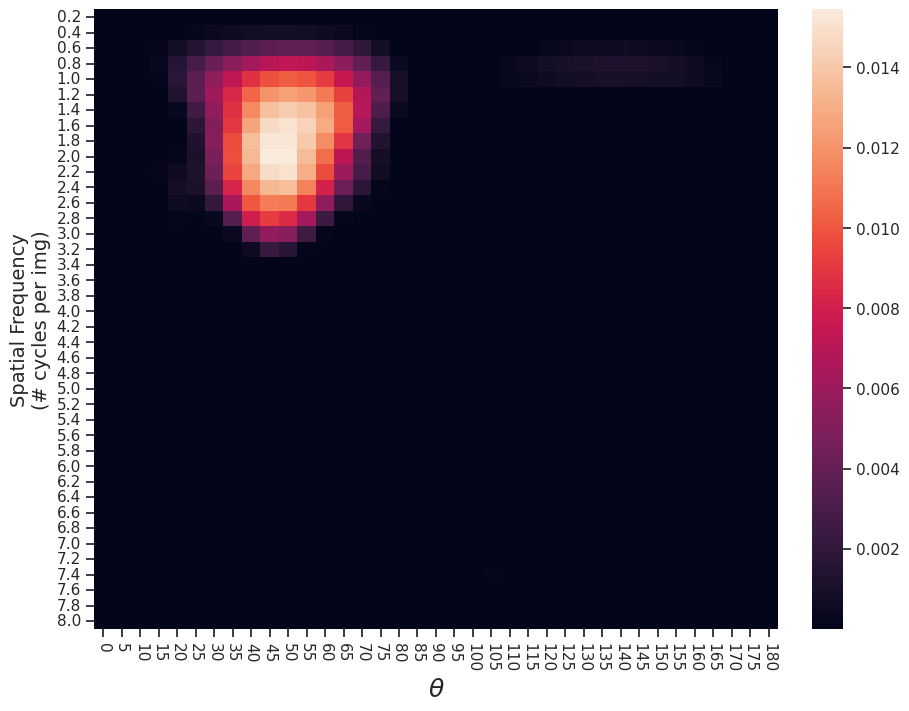

In [15]:
fig, ax = create_figure(1, 1, (9, 7))

sns.heatmap(data=x2p, ax=ax)

ax.set_ylabel('Spatial Frequency\n(# cycles per img)', fontsize=14)
ax.set_xlabel(r'$\theta$', fontsize=18)

s_freq = param_grid.param_dict['s_freq']
ax.set_yticks(np.array(range(len(s_freq))) + 0.5)
ax.set_yticklabels(s_freq, rotation=0)

theta = param_grid.param_dict['theta']
ax.set_xticks(np.array(range(len(theta))) + 0.5)
ax.set_xticklabels([str(int(angle)) for angle in theta], rotation=-90)

plt.show()

In [16]:
favorite_idx = np.argmax(tuning)
favorite_params = param_grid[favorite_idx]

favorite_params

{'contrast': 1.0, 's_freq': 2.0, 'theta': 50.0}

In [17]:
favorite_s_freq_idx = param_grid.param_dict['s_freq'] == favorite_params['s_freq']
favorite_s_freq_idx = np.where(favorite_s_freq_idx)[0].item()

favorite_s_freq_idx

9

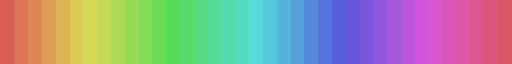

In [18]:
periodic_cmap, base_colors = get_periodic_palette(
    len(param_grid.param_dict['theta']))

periodic_cmap

In [19]:
tuning_curve_theta = tuning[0, favorite_s_freq_idx]
color = base_colors[np.argmax(tuning_curve_theta)]

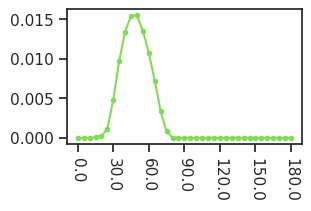

In [20]:
fig, ax = create_figure()
ax.plot(tuning_curve_theta, color=color, marker='.')

xticks, xticklabels = zip(*[
    (i, v) for i, v in
    enumerate(param_grid.param_dict['theta'])
    if i % 6 == 0
])
ax.set(xticks=xticks, xticklabels=xticklabels)
ax.tick_params(axis='x', labelrotation=-90)
plt.show()

## Now contrast/latency exploration

### Make feeder

In [21]:
favorite_params

{'contrast': 1.0, 's_freq': 2.0, 'theta': 50.0}

In [22]:
param_grid = drifting_grating_feeder_params(
    contrast_min=0.1,
    contrast_max=1.0,
    contrast_delta=0.1,
    s_freq_min=favorite_params['s_freq'],
    s_freq_max=favorite_params['s_freq'],
    theta_min=favorite_params['theta'],
    theta_max=favorite_params['theta'],
)
n_frames_for_full_cycle = 500

feeder, feeder_kws = drifting_grating_feeder(
    npix=tr.model.cfg.input_sz[-1],
    param_grid=param_grid,
    device=device,
    n_frames_per_cycle=n_frames_for_full_cycle,
)

In [23]:
len(param_grid)

10

### Movie of feeder

In [75]:
feeder_kws['flatten'] = False
feeder = FEEDER_CLASSES['drifting-grating'](**feeder_kws)

In [76]:
frames = [feeder[t] for t in range(n_frames_for_full_cycle + 1)]
frames = torch.cat(frames, dim=1)
frames.shape

torch.Size([10, 501, 16, 16])

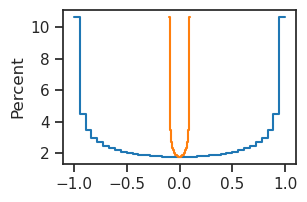

In [77]:
histplot(frames[-1].ravel(), stat='percent')
histplot(frames[0].ravel(), stat='percent');

<Axes: ylabel='Count'>

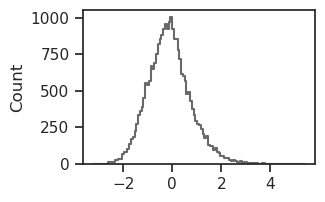

In [81]:
histplot(tr.dl_vld.dataset.tensors[0][:100].ravel(), color='dimgrey')

In [78]:
show_movie(tonp(frames[-1].squeeze()), n_frames=500, vmin=-1.0, vmax=1.0)

In [79]:
show_movie(tonp(frames[2].squeeze()), n_frames=500, vmin=-1.0, vmax=1.0)

In [82]:
n_trials = 10
seq = range(n_frames_for_full_cycle * (n_trials + 1))

print(seq)

range(0, 5500)

### Xtract ftrs

In [83]:
feeder_kws['flatten'] = True
feeder = FEEDER_CLASSES['drifting-grating'](**feeder_kws)

In [84]:
%%time

output = tr.model.xtract_ftr(
    feeder=feeder,
    seq=seq,
    return_extras=['samples', 'u', 'r2'],
).stack()

CPU times: user 15.7 s, sys: 272 ms, total: 16 s
Wall time: 38.5 s


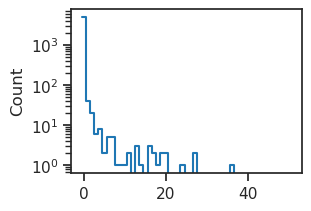

In [85]:
spks = tonp(output['samples'][:, -1].ravel()).astype(int)

fig, ax = create_figure()
histplot(spks, bins=np.linspace(0, 51, 52) - 0.5)
ax.set(yscale='log')
plt.show()

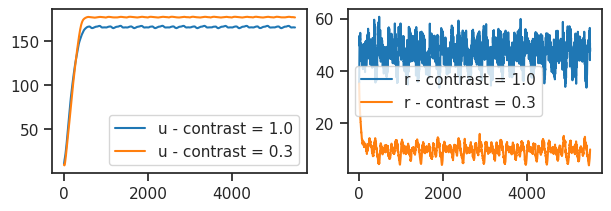

In [87]:
u_norm = tonp(torch.linalg.norm(output['u'], axis=-1))
r_norm = tonp(torch.linalg.norm(torch.exp(output['u']), axis=-1))

fig, axes = create_figure(1, 2)

for idx in [9, 2]:
    cntrst = param_grid.param_dict['contrast'][idx]
    axes[0].plot(u_norm[idx], ls='-', label=f'u - contrast = {cntrst}')
    axes[1].plot(r_norm[idx], ls='-', label=f'r - contrast = {cntrst}')

add_legend(axes)
plt.show()

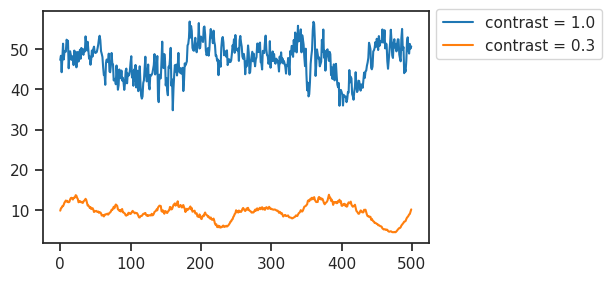

In [88]:
fig, ax = create_figure(1, 1, (6, 2.7))

idxs = [9, 2]
intvl = range(1000, 1500)

idx = idxs[0]
cntrst = param_grid.param_dict['contrast'][idx]
ax.plot(r_norm[idx][intvl], ls='-', label=f'contrast = {cntrst}')

idx = idxs[1]
cntrst = param_grid.param_dict['contrast'][idx]
ax.plot(r_norm[idx][intvl], ls='-', label=f'contrast = {cntrst}')

add_legend(ax)
move_legend(ax, bbox=(1, 1.04))

plt.show()

### Most responsive neurons

In [89]:
firing_rates = torch.exp(output['u'])
r_norms_time = torch.linalg.norm(firing_rates, dim=1)

firing_rates.shape, r_norms_time.shape

(torch.Size([10, 5500, 512]), torch.Size([10, 512]))

In [90]:
contrast_i = -1

most_active_neurons = np.argsort(tonp(
    r_norms_time[contrast_i]
))[::-1]

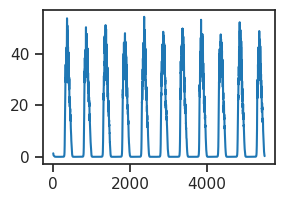

In [91]:
neuron_i = most_active_neurons[0]
plot(firing_rates[-1, :, neuron_i])

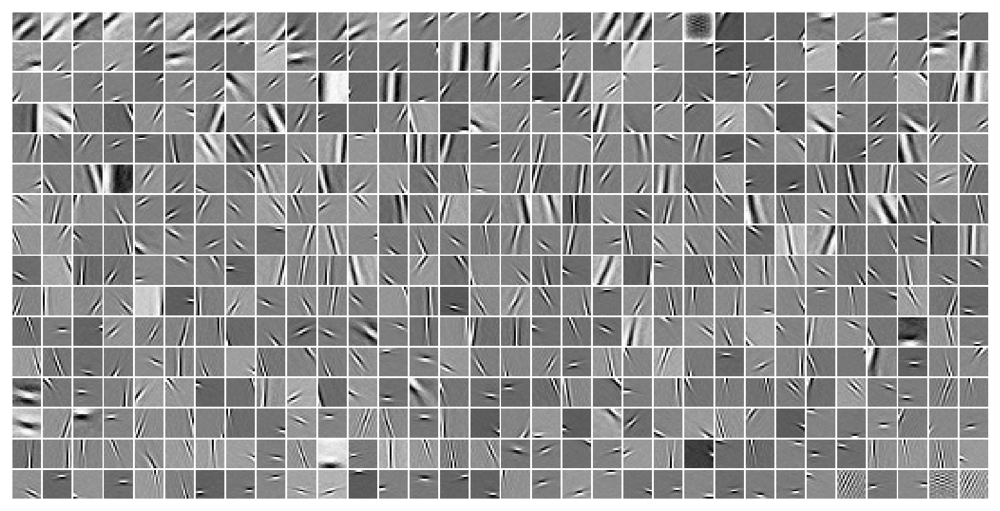

In [92]:
tr.model.show(order=most_active_neurons);

In [93]:
which_neuron = 0

spks_high_contrast = tonp(output['samples'][-1, :, most_active_neurons[which_neuron]])
spks_low_contrast = tonp(output['samples'][1, :, most_active_neurons[which_neuron]])

spks_low_contrast.shape, spks_high_contrast.shape

((5500,), (5500,))

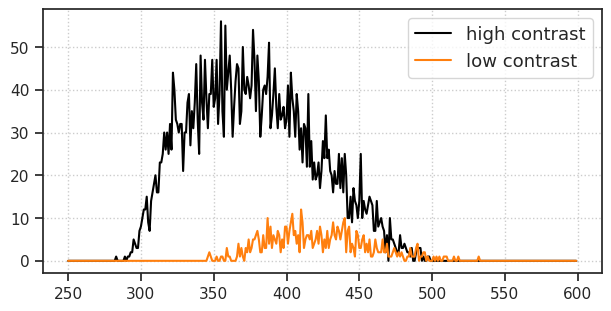

In [94]:
intvl = range(250, 600)

fig, ax = create_figure(1, 1, (6, 3))
ax.plot(intvl, spks_high_contrast[intvl], color='k', label='high contrast')
ax.plot(intvl, spks_low_contrast[intvl], color='C1', label='low contrast')
# ax.axvline(500, color='dimgrey', ls='--', label='stimulus onset')

ax.legend(fontsize=13)
ax.grid()

plt.show()

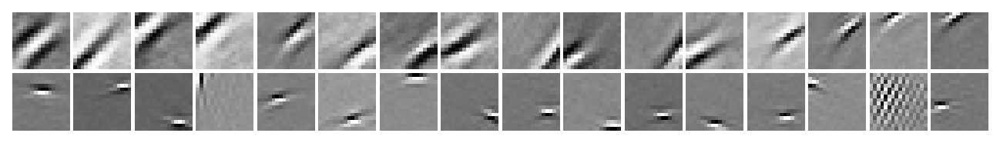

In [95]:
w = tonp(tr.model.layer.get_weight())
w = w.T.reshape(-1, 16, 16)

num = 16
num_skip = 3

x2p = np.concatenate([
    w[most_active_neurons[:num]],
    w[most_active_neurons[-num-num_skip:-num_skip]],
], axis=0)

plot_weights(x2p, nrows=2)
plt.show()

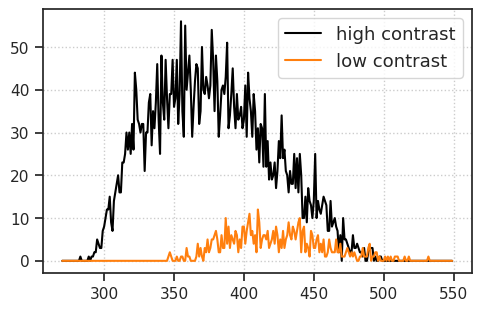

In [96]:
intvl = range(270, 550)

fig, ax = create_figure(1, 1, (4.7, 3))
ax.plot(intvl, spks_high_contrast[intvl], color='k', label='high contrast')
ax.plot(intvl, spks_low_contrast[intvl], color='C1', label='low contrast')
# ax.axvline(500, color='dimgrey', ls='--', label='stimulus onset')

ax.legend(fontsize=13)
ax.grid()

plt.show()

## First harmonic

Carandini 1997 analysis

In [99]:
spike_train = spks_high_contrast[n_frames_for_full_cycle:]
spike_train.shape

(5000,)

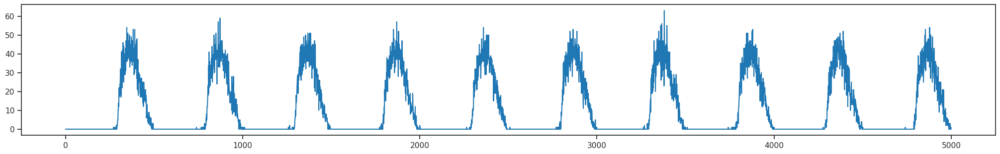

In [100]:
fig, ax = create_figure(1, 1, (20, 3))
plt.plot(spike_train);

In [102]:
total_time = len(spike_train)
t_freq = 1 / n_frames_for_full_cycle
ts = np.arange(total_time)

first_harmonic = np.sum(spike_train * np.exp(-2j * np.pi * t_freq * ts)) / total_time

In [103]:
amplitude = 2 * np.abs(first_harmonic)  # Multiply by 2 for one-sided spectrum
phase_radians = np.angle(first_harmonic)
phase_degrees = np.degrees(phase_radians)

In [110]:
bin_size_in_seconds = 1  # adjust to your actual bin size
amplitude_spikes_per_sec = amplitude / bin_size_in_seconds

print(f"Response amplitude: {amplitude_spikes_per_sec:.2f} spikes/sec")
print(f"Response phase: {phase_degrees:.2f} degrees")

Response amplitude: 17.54 spikes/sec

Response phase: 90.05 degrees